In [3]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Load the Sentencing Dataset
ussc_df = pd.read_csv('../data/sentencing.csv')

# Define MONRACE values to update NEWRACE
specific_monraces = {
    'American Indian or Alaskan Native': 'American Indian or Alaskan Native',
    'Asian or Pacific Islander': 'Asian or Pacific Islander'
}

# Update NEWRACE where MONRACE is specific
for monrace, newrace in specific_monraces.items():
    ussc_df.loc[ussc_df['MONRACE'] == monrace, 'NEWRACE'] = newrace

# Select relevant features based on provided dataset example
selected_features = [
    'AGE',          # Defendant's age
    'NEWRACE',      # Biological Race of defendant at sentencing
    'MONSEX',       # Gender of defendant at sentencing
    'EDUCATN',      # Education level
    'CHEMDES1',     # Description of first charge
    'CHEMTYP1',     # Type/category of first charge
    'DISTRICT',     # Judicial district
    'CIRCDIST',     # Circuit district
    'CRIMHIST',     # Criminal history
    'SENTYR',       # Year of sentencing
    'CITIZEN',      # Citizenship status
    'CITWHERE',     # Country of citizenship/origin
    'NUMDEPEN',     # Number of dependents
    'CRIMLIV',      # Criminal living situation
    'SENTMON',      # Sentencing month
    'ZONE',         # Geographic zone
    'DISPOSIT',     # Case disposition
]

# Create feature matrix X
X = ussc_df[selected_features]

# Handle categorical variables by encoding
X_encoded = pd.get_dummies(X, columns=[
    'NEWRACE', 'MONSEX', 'EDUCATN', 
    'CHEMDES1', 'CHEMTYP1', 
    'DISTRICT', 'CIRCDIST', 
    'CRIMHIST', 'SENTYR', 
    'CITIZEN', 'CITWHERE', 
    'CRIMLIV', 'ZONE', 'DISPOSIT'], drop_first=True)

# Display selected features
print("Selected Features:", X_encoded.columns.tolist())
print(X.head())
print(X.shape)

# Proceed with exploratory analysis (e.g., correlation, visualization)


/var/folders/3q/y3lhffxj6dl1rxzx2yw0441m0000gn/T/ipykernel_72285/2914275896.py:5: DtypeWarning: Columns (18,25,26,29,68,69,70,71,72,73,74,75,76,77,79,80,106,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,130,131,132,133,134,135,136,137,138,139,140,141,142,149,150,151,152,153,154,155,156,157,158,159,160,161,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,237,240,241,314,334,346,347,351,352,353,357,358,363,364,369,375,380,392,396,403,404,416,434,454,455,456,457,458,459,460,461,462,463,464,465,470,494,495,496,497,498,499,500,501,502,503,504,505,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,532,544,545,547,549,551,553,562,563) have mixed types. Specify dtype option on import or set low_memory=False.
  ussc_df = pd.read_csv('../data/sentencing.csv')


Selected Features: ['AGE', 'NUMDEPEN', 'SENTMON', 'NEWRACE_Asian or Pacific Islander', 'NEWRACE_Black', 'NEWRACE_Hispanic', 'NEWRACE_Other', 'NEWRACE_White', 'MONSEX_Male', 'EDUCATN_College graduate', 'EDUCATN_Eight years of school completed', 'EDUCATN_Eleven years of school completed', 'EDUCATN_Five years of school completed', 'EDUCATN_Four years of school completed', 'EDUCATN_G.E.D. (general education diploma)', 'EDUCATN_Graduate degree (MST, J.D., M.D., PH.D., etc)', 'EDUCATN_High school graduate', 'EDUCATN_Middle school / junior high', 'EDUCATN_Military training', 'EDUCATN_Nine years of school completed', 'EDUCATN_No schooling', 'EDUCATN_One year of college / freshman', 'EDUCATN_One year of school completed', 'EDUCATN_Seven years of school completed', 'EDUCATN_Six years of school completed', 'EDUCATN_Some college', 'EDUCATN_Some elementary school', 'EDUCATN_Some graduate school', 'EDUCATN_Some high school', 'EDUCATN_Some trade or vocational school', 'EDUCATN_Ten years of school com

In [4]:
print(X['NEWRACE'].unique())
print(X['NEWRACE'].value_counts())

['Hispanic' 'White' 'Black' 'Other' 'American Indian or Alaskan Native'
 'Asian or Pacific Islander' nan]
NEWRACE
Hispanic                             42492
Black                                15326
White                                15033
American Indian or Alaskan Native     1552
Asian or Pacific Islander             1119
Other                                  207
Name: count, dtype: int64


In [5]:
missing_counts = X.isna().sum().sort_values(ascending=False)
print("Top 10 features with most missing values:")
print(missing_counts.head(10))

Top 10 features with most missing values:
CHEMDES1    76536
CHEMTYP1    76509
NUMDEPEN     8488
EDUCATN      8471
CRIMLIV      5088
CRIMHIST     2020
CITWHERE     1383
ZONE         1156
NEWRACE       809
CITIZEN       428
dtype: int64


In [6]:
# print("Basic Descriptive Statistics:")
print(X.describe(include='all'))
X["NEWRACE"].describe()

                 AGE   NEWRACE MONSEX               EDUCATN  \
count   76485.000000     75729  76427                 68067   
unique           NaN         6      2                    28   
top              NaN  Hispanic   Male  High school graduate   
freq             NaN     42492  67037                 11797   
mean       36.381147       NaN    NaN                   NaN   
std        10.935522       NaN    NaN                   NaN   
min        16.000000       NaN    NaN                   NaN   
25%        28.000000       NaN    NaN                   NaN   
50%        35.000000       NaN    NaN                   NaN   
75%        43.000000       NaN    NaN                   NaN   
max        86.000000       NaN    NaN                   NaN   

                                                 CHEMDES1         CHEMTYP1  \
count                                                   2               29   
unique                                                  2                3   
top     W

count        75729
unique           6
top       Hispanic
freq         42492
Name: NEWRACE, dtype: object

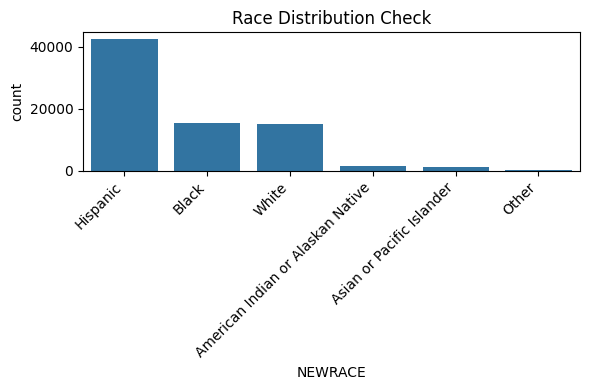

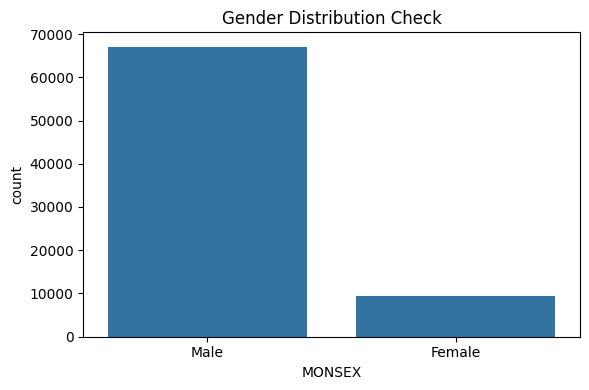

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sort 'NEWRACE' by count
race_order = X['NEWRACE'].value_counts().index

plt.figure(figsize=(6, 4))
sns.countplot(x='NEWRACE', data=X, order=race_order)
plt.title('Race Distribution Check')
plt.xticks(rotation=45, ha='right')  # Align labels properly
plt.tight_layout()
plt.show()


plt.figure(figsize=(6,4))
sns.countplot(x='MONSEX', data=X)
plt.title('Gender Distribution Check')
plt.tight_layout()
plt.show()


In [8]:
import plotly.express as px

fig = px.scatter(
    X,
    x='AGE',
    y='EDUCATN',
    color='NEWRACE',
    hover_data=['CITIZEN', 'DISTRICT'],  # Add additional details
    title='Age vs. Education Check'
)
fig.update_traces(marker=dict(size=6, opacity=0.7))  # Adjust marker size and opacity
fig.show()
